# 프로젝트: 자율주행 보조 시스템 만들기

In [19]:
import os, copy, cv2
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds

import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

print(tf.__version__) # 2.6.0

2.10.1


# 0. 모델 만들기

## 데이터셋 준비

In [2]:
(train_dataset, val_dataset), dataset_info = tfds.load(
    "kitti", split=["train", "validation"],
    shuffle_files=True, with_info=True, data_dir='D:/DATA/tdfs/') #data_dir=DATA_PATH

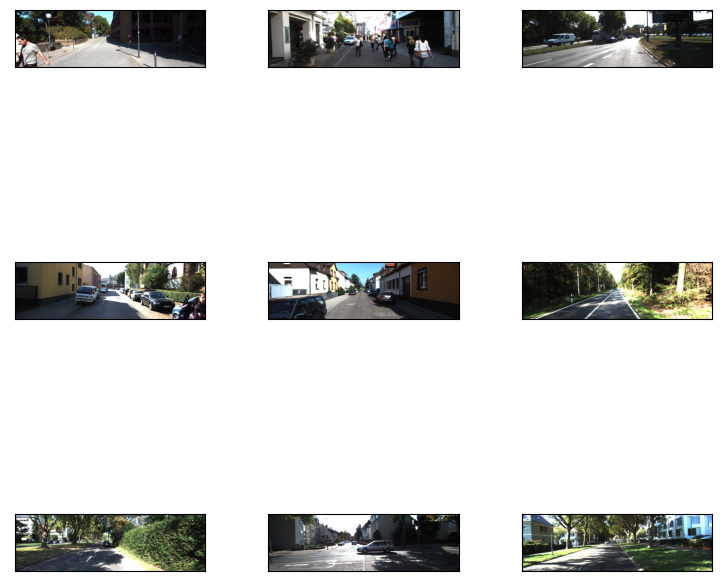

In [3]:
_ = tfds.show_examples(train_dataset, dataset_info)

In [104]:
dataset_info.features['objects']

Sequence({
    'alpha': float32,
    'bbox': BBoxFeature(shape=(4,), dtype=float32),
    'dimensions': Tensor(shape=(3,), dtype=float32),
    'location': Tensor(shape=(3,), dtype=float32),
    'occluded': ClassLabel(shape=(), dtype=int64, num_classes=4),
    'rotation_y': float32,
    'truncated': float32,
    'type': ClassLabel(shape=(), dtype=int64, num_classes=8),
})

- 차량이 주행 중에 볼 수 있는 이미지 데이터이다.
    - 실제 상황에서도 주행 중이라는 전제가 있으므로 회전이나 상하 반전 등의 증강 효과는 크지는 않을 것으로 예상된다.

- 전처리 함수

In [4]:
# x, y 좌표 순서 수정: PIL 등에서 사용하는 순서와 다른 부분 해결
def swap_xy(boxes):
    return tf.stack([boxes[:, 1], boxes[:, 0], boxes[:, 3], boxes[:, 2]], axis=-1)

# 사진 뒤집기: Augmentation 효과
def random_flip_horizontal(image, boxes):
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        boxes = tf.stack(
           [1 - boxes[:, 2], boxes[:, 1], 1 - boxes[:, 0], boxes[:, 3]], axis=-1
        )
        
    return image, boxes

# 비율 유지
def resize_and_pad_image(image, training=True):

    min_side = 800.0
    max_side = 1333.0
    min_side_range = [640, 1024]
    stride = 128.0
    
    image_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
    if training:
        min_side = tf.random.uniform((), min_side_range[0], min_side_range[1], dtype=tf.float32)
    ratio = min_side / tf.reduce_min(image_shape)
    if ratio * tf.reduce_max(image_shape) > max_side:
        ratio = max_side / tf.reduce_max(image_shape)
    image_shape = ratio * image_shape
    image = tf.image.resize(image, tf.cast(image_shape, dtype=tf.int32))
    padded_image_shape = tf.cast(
        tf.math.ceil(image_shape / stride) * stride, dtype=tf.int32
    )
    image = tf.image.pad_to_bounding_box(
        image, 0, 0, padded_image_shape[0], padded_image_shape[1]
    )
    return image, image_shape, ratio

def convert_to_xywh(boxes):
    return tf.concat(
        [(boxes[..., :2] + boxes[..., 2:]) / 2.0, boxes[..., 2:] - boxes[..., :2]],
        axis=-1)

def preprocess_data(sample):
    image = sample["image"]
    bbox = swap_xy(sample["objects"]["bbox"])
    class_id = tf.cast(sample["objects"]["type"], dtype=tf.int32)

    image, bbox = random_flip_horizontal(image, bbox)
    image, image_shape, _ = resize_and_pad_image(image)

    bbox = tf.stack(
        [
            bbox[:, 0] * image_shape[1],
            bbox[:, 1] * image_shape[0],
            bbox[:, 2] * image_shape[1],
            bbox[:, 3] * image_shape[0],
        ],
        axis=-1,
    )
    bbox = convert_to_xywh(bbox)
    return image, bbox, class_id

- 인코딩

In [5]:
class AnchorBox:
    def __init__(self):
        self.aspect_ratios = [0.5, 1.0, 2.0]
        self.scales = [2 ** x for x in [0, 1 / 3, 2 / 3]]

        self._num_anchors = len(self.aspect_ratios) * len(self.scales)
        self._strides = [2 ** i for i in range(3, 8)]
        self._areas = [x ** 2 for x in [32.0, 64.0, 128.0, 256.0, 512.0]]
        self._anchor_dims = self._compute_dims()

    def _compute_dims(self):
        anchor_dims_all = []
        for area in self._areas:
            anchor_dims = []
            for ratio in self.aspect_ratios:
                anchor_height = tf.math.sqrt(area / ratio)
                anchor_width = area / anchor_height
                dims = tf.reshape(
                    tf.stack([anchor_width, anchor_height], axis=-1), [1, 1, 2]
                )
                for scale in self.scales:
                    anchor_dims.append(scale * dims)
            anchor_dims_all.append(tf.stack(anchor_dims, axis=-2))
        return anchor_dims_all

    def _get_anchors(self, feature_height, feature_width, level):
        rx = tf.range(feature_width, dtype=tf.float32) + 0.5
        ry = tf.range(feature_height, dtype=tf.float32) + 0.5
        centers = tf.stack(tf.meshgrid(rx, ry), axis=-1) * self._strides[level - 3]
        centers = tf.expand_dims(centers, axis=-2)
        centers = tf.tile(centers, [1, 1, self._num_anchors, 1])
        dims = tf.tile(
            self._anchor_dims[level - 3], [feature_height, feature_width, 1, 1]
        )
        anchors = tf.concat([centers, dims], axis=-1)
        return tf.reshape(
            anchors, [feature_height * feature_width * self._num_anchors, 4]
        )

    def get_anchors(self, image_height, image_width):
        anchors = [
            self._get_anchors(
                tf.math.ceil(image_height / 2 ** i),
                tf.math.ceil(image_width / 2 ** i),
                i,
            )
            for i in range(3, 8)
        ]
        return tf.concat(anchors, axis=0)
    
def convert_to_corners(boxes):
    return tf.concat(
        [boxes[..., :2] - boxes[..., 2:] / 2.0, boxes[..., :2] + boxes[..., 2:] / 2.0],
        axis=-1,
    )

def compute_iou(boxes1, boxes2):
    boxes1_corners = convert_to_corners(boxes1)
    boxes2_corners = convert_to_corners(boxes2)
    lu = tf.maximum(boxes1_corners[:, None, :2], boxes2_corners[:, :2])
    rd = tf.minimum(boxes1_corners[:, None, 2:], boxes2_corners[:, 2:])
    intersection = tf.maximum(0.0, rd - lu)
    intersection_area = intersection[:, :, 0] * intersection[:, :, 1]
    boxes1_area = boxes1[:, 2] * boxes1[:, 3]
    boxes2_area = boxes2[:, 2] * boxes2[:, 3]
    union_area = tf.maximum(
        boxes1_area[:, None] + boxes2_area - intersection_area, 1e-8
    )
    return tf.clip_by_value(intersection_area / union_area, 0.0, 1.0)

class LabelEncoder:

    def __init__(self):
        self._anchor_box = AnchorBox()
        self._box_variance = tf.convert_to_tensor(
            [0.1, 0.1, 0.2, 0.2], dtype=tf.float32
        )

    def _match_anchor_boxes(
        self, anchor_boxes, gt_boxes, match_iou=0.5, ignore_iou=0.4
    ):
        iou_matrix = compute_iou(anchor_boxes, gt_boxes)
        max_iou = tf.reduce_max(iou_matrix, axis=1)
        matched_gt_idx = tf.argmax(iou_matrix, axis=1)
        positive_mask = tf.greater_equal(max_iou, match_iou)
        negative_mask = tf.less(max_iou, ignore_iou)
        ignore_mask = tf.logical_not(tf.logical_or(positive_mask, negative_mask))
        return (
            matched_gt_idx,
            tf.cast(positive_mask, dtype=tf.float32),
            tf.cast(ignore_mask, dtype=tf.float32),
        )

    def _compute_box_target(self, anchor_boxes, matched_gt_boxes):
        box_target = tf.concat(
            [
                (matched_gt_boxes[:, :2] - anchor_boxes[:, :2]) / anchor_boxes[:, 2:],
                tf.math.log(matched_gt_boxes[:, 2:] / anchor_boxes[:, 2:]),
            ],
            axis=-1,
        )
        box_target = box_target / self._box_variance
        return box_target

    def _encode_sample(self, image_shape, gt_boxes, cls_ids):
        anchor_boxes = self._anchor_box.get_anchors(image_shape[1], image_shape[2])
        cls_ids = tf.cast(cls_ids, dtype=tf.float32)
        matched_gt_idx, positive_mask, ignore_mask = self._match_anchor_boxes(
            anchor_boxes, gt_boxes
        )
        matched_gt_boxes = tf.gather(gt_boxes, matched_gt_idx)
        box_target = self._compute_box_target(anchor_boxes, matched_gt_boxes)
        matched_gt_cls_ids = tf.gather(cls_ids, matched_gt_idx)
        cls_target = tf.where(
            tf.not_equal(positive_mask, 1.0), -1.0, matched_gt_cls_ids
        )
        cls_target = tf.where(tf.equal(ignore_mask, 1.0), -2.0, cls_target)
        cls_target = tf.expand_dims(cls_target, axis=-1)
        label = tf.concat([box_target, cls_target], axis=-1)
        return label

    def encode_batch(self, batch_images, gt_boxes, cls_ids):
        images_shape = tf.shape(batch_images)
        batch_size = images_shape[0]

        labels = tf.TensorArray(dtype=tf.float32, size=batch_size, dynamic_size=True)
        for i in range(batch_size):
            label = self._encode_sample(images_shape, gt_boxes[i], cls_ids[i])
            labels = labels.write(i, label)
        batch_images = tf.keras.applications.resnet.preprocess_input(batch_images)
        return batch_images, labels.stack()

## 모델 준비

In [6]:
class FeaturePyramid(tf.keras.layers.Layer):

    def __init__(self, backbone):
        super(FeaturePyramid, self).__init__(name="FeaturePyramid")
        self.backbone = backbone
        self.conv_c3_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c4_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c5_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c3_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c4_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c5_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c6_3x3 = tf.keras.layers.Conv2D(256, 3, 2, "same")
        self.conv_c7_3x3 = tf.keras.layers.Conv2D(256, 3, 2, "same")
        self.upsample_2x = tf.keras.layers.UpSampling2D(2)

    def call(self, images, training=False):
        c3_output, c4_output, c5_output = self.backbone(images, training=training)
        p3_output = self.conv_c3_1x1(c3_output)
        p4_output = self.conv_c4_1x1(c4_output)
        p5_output = self.conv_c5_1x1(c5_output)
        p4_output = p4_output + self.upsample_2x(p5_output)
        p3_output = p3_output + self.upsample_2x(p4_output)
        p3_output = self.conv_c3_3x3(p3_output)
        p4_output = self.conv_c4_3x3(p4_output)
        p5_output = self.conv_c5_3x3(p5_output)
        p6_output = self.conv_c6_3x3(c5_output)
        p7_output = self.conv_c7_3x3(tf.nn.relu(p6_output))
        return p3_output, p4_output, p5_output, p6_output, p7_output

def build_head(output_filters, bias_init):
    head = tf.keras.Sequential([tf.keras.Input(shape=[None, None, 256])])
    kernel_init = tf.initializers.RandomNormal(0.0, 0.01)
    for _ in range(4):
        head.add(
            tf.keras.layers.Conv2D(256, 3, padding="same", kernel_initializer=kernel_init)
        )
        head.add(tf.keras.layers.ReLU())
    head.add(
        tf.keras.layers.Conv2D(
            output_filters,
            3,
            1,
            padding="same",
            kernel_initializer=kernel_init,
            bias_initializer=bias_init,
        )
    )
    return head

def get_backbone():
    backbone = tf.keras.applications.ResNet50(
        include_top=False, input_shape=[None, None, 3]
    )
    c3_output, c4_output, c5_output = [
        backbone.get_layer(layer_name).output
        for layer_name in ["conv3_block4_out", "conv4_block6_out", "conv5_block3_out"]
    ]
    return tf.keras.Model(
        inputs=[backbone.inputs], outputs=[c3_output, c4_output, c5_output]
    )

class RetinaNet(tf.keras.Model):

    def __init__(self, num_classes, backbone):
        super(RetinaNet, self).__init__(name="RetinaNet")
        self.fpn = FeaturePyramid(backbone)
        self.num_classes = num_classes

        prior_probability = tf.constant_initializer(-np.log((1 - 0.01) / 0.01))
        self.cls_head = build_head(9 * num_classes, prior_probability)
        self.box_head = build_head(9 * 4, "zeros")

    def call(self, image, training=False):
        features = self.fpn(image, training=training)
        N = tf.shape(image)[0]
        cls_outputs = []
        box_outputs = []
        for feature in features:
            box_outputs.append(tf.reshape(self.box_head(feature), [N, -1, 4]))
            cls_outputs.append(
                tf.reshape(self.cls_head(feature), [N, -1, self.num_classes])
            )
        cls_outputs = tf.concat(cls_outputs, axis=1)
        box_outputs = tf.concat(box_outputs, axis=1)
        return tf.concat([box_outputs, cls_outputs], axis=-1)
    
class RetinaNetBoxLoss(tf.losses.Loss):

    def __init__(self, delta):
        super(RetinaNetBoxLoss, self).__init__(
            reduction="none", name="RetinaNetBoxLoss"
        )
        self._delta = delta

    def call(self, y_true, y_pred):
        difference = y_true - y_pred
        absolute_difference = tf.abs(difference)
        squared_difference = difference ** 2
        loss = tf.where(
            tf.less(absolute_difference, self._delta),
            0.5 * squared_difference,
            absolute_difference - 0.5,
        )
        return tf.reduce_sum(loss, axis=-1)


class RetinaNetClassificationLoss(tf.losses.Loss):

    def __init__(self, alpha, gamma):
        super(RetinaNetClassificationLoss, self).__init__(
            reduction="none", name="RetinaNetClassificationLoss"
        )
        self._alpha = alpha
        self._gamma = gamma

    def call(self, y_true, y_pred):
        cross_entropy = tf.nn.sigmoid_cross_entropy_with_logits(
            labels=y_true, logits=y_pred
        )
        probs = tf.nn.sigmoid(y_pred)
        alpha = tf.where(tf.equal(y_true, 1.0), self._alpha, (1.0 - self._alpha))
        pt = tf.where(tf.equal(y_true, 1.0), probs, 1 - probs)
        loss = alpha * tf.pow(1.0 - pt, self._gamma) * cross_entropy
        return tf.reduce_sum(loss, axis=-1)


class RetinaNetLoss(tf.losses.Loss):

    def __init__(self, num_classes=8, alpha=0.25, gamma=2.0, delta=1.0):
        super(RetinaNetLoss, self).__init__(reduction="auto", name="RetinaNetLoss")
        self._clf_loss = RetinaNetClassificationLoss(alpha, gamma)
        self._box_loss = RetinaNetBoxLoss(delta)
        self._num_classes = num_classes

    def call(self, y_true, y_pred):
        y_pred = tf.cast(y_pred, dtype=tf.float32)
        box_labels = y_true[:, :, :4]
        box_predictions = y_pred[:, :, :4]
        cls_labels = tf.one_hot(
            tf.cast(y_true[:, :, 4], dtype=tf.int32),
            depth=self._num_classes,
            dtype=tf.float32,
        )
        cls_predictions = y_pred[:, :, 4:]
        positive_mask = tf.cast(tf.greater(y_true[:, :, 4], -1.0), dtype=tf.float32)
        ignore_mask = tf.cast(tf.equal(y_true[:, :, 4], -2.0), dtype=tf.float32)
        clf_loss = self._clf_loss(cls_labels, cls_predictions)
        box_loss = self._box_loss(box_labels, box_predictions)
        clf_loss = tf.where(tf.equal(ignore_mask, 1.0), 0.0, clf_loss)
        box_loss = tf.where(tf.equal(positive_mask, 1.0), box_loss, 0.0)
        normalizer = tf.reduce_sum(positive_mask, axis=-1)
        clf_loss = tf.math.divide_no_nan(tf.reduce_sum(clf_loss, axis=-1), normalizer)
        box_loss = tf.math.divide_no_nan(tf.reduce_sum(box_loss, axis=-1), normalizer)
        loss = clf_loss + box_loss
        return loss

## Training

In [7]:
num_classes = dataset_info.features['objects']['type'].num_classes # 8

resnet50_backbone = get_backbone()
loss_fn = RetinaNetLoss(num_classes)
model = RetinaNet(num_classes, resnet50_backbone)

c:\Users\AIDL_\anaconda3\envs\env01\lib\site-packages\keras\initializers\initializers_v2.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


- Config

In [9]:
batch_size = 2

learning_rates = [2.5e-06, 0.000625, 0.00125, 0.0025, 0.00025, 2.5e-05]
learning_rate_boundaries = [125, 250, 500, 240000, 360000]
learning_rate_fn = tf.optimizers.schedules.PiecewiseConstantDecay(
    boundaries=learning_rate_boundaries, values=learning_rates)

optimizer = tf.optimizers.SGD(learning_rate=learning_rate_fn, momentum=0.9)
model.compile(loss=loss_fn, optimizer=optimizer)

- Dataset

In [10]:
label_encoder = LabelEncoder()

autotune = tf.data.AUTOTUNE
train_dataset = train_dataset.map(preprocess_data, num_parallel_calls=autotune)
train_dataset = train_dataset.shuffle(8 * batch_size)
train_dataset = train_dataset.padded_batch(
    batch_size=batch_size, padding_values=(0.0, 1e-8, -1), drop_remainder=True
)
train_dataset = train_dataset.map(
    label_encoder.encode_batch, num_parallel_calls=autotune
)
train_dataset = train_dataset.prefetch(autotune)

val_dataset = val_dataset.map(preprocess_data, num_parallel_calls=autotune)
val_dataset = val_dataset.padded_batch(
    batch_size=1, padding_values=(0.0, 1e-8, -1), drop_remainder=True
)
val_dataset = val_dataset.map(label_encoder.encode_batch, num_parallel_calls=autotune)
val_dataset = val_dataset.prefetch(autotune)

- Training

In [11]:
model_dir = './checkpoints/'
callbacks_list = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(model_dir, "weights" + "_epoch_{epoch}"),
        monitor="val_loss",
        save_best_only=False,
        save_weights_only=True,
        verbose=1,
    )
]

epochs = 20

history = model.fit(train_dataset, validation_data=val_dataset,
                    epochs=epochs, callbacks=callbacks_list)

Epoch 1/20
3173/3173 [==============================] - ETA: 0s - loss: 2.5438
Epoch 1: saving model to ./checkpoints\weights_epoch_1
3173/3173 [==============================] - 569s 176ms/step - loss: 2.5438 - val_loss: 1.8064
Epoch 2/20
3173/3173 [==============================] - ETA: 0s - loss: 1.1206
Epoch 2: saving model to ./checkpoints\weights_epoch_2
3173/3173 [==============================] - 557s 175ms/step - loss: 1.1206 - val_loss: 1.3335
Epoch 3/20
3173/3173 [==============================] - ETA: 0s - loss: 0.8108
Epoch 3: saving model to ./checkpoints\weights_epoch_3
3173/3173 [==============================] - 557s 175ms/step - loss: 0.8108 - val_loss: 1.1718
Epoch 4/20
3173/3173 [==============================] - ETA: 0s - loss: 0.6530
Epoch 4: saving model to ./checkpoints\weights_epoch_4
3173/3173 [==============================] - 560s 176ms/step - loss: 0.6530 - val_loss: 1.0047
Epoch 5/20
3173/3173 [==============================] - ETA: 0s - loss: 0.5395
Epoch

In [105]:
model.summary()

Model: "RetinaNet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 FeaturePyramid (FeaturePyra  multiple                 31585152  
 mid)                                                            
                                                                 
 sequential (Sequential)     (None, None, None, 72)    2526280   
                                                                 
 sequential_1 (Sequential)   (None, None, None, 36)    2443300   
                                                                 
Total params: 36,554,732
Trainable params: 36,501,612
Non-trainable params: 53,120
_________________________________________________________________


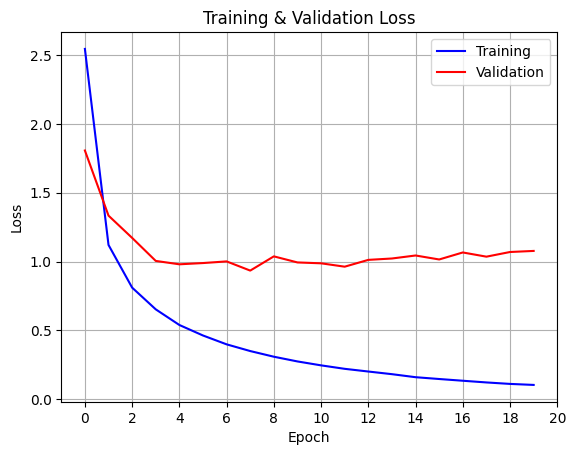

In [29]:
plt.plot(history.history['loss'], 'b')
plt.plot(history.history['val_loss'], 'r')
plt.title('Training & Validation Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Training', 'Validation'])
plt.grid(True)
plt.xlim(-1, 20)
plt.xticks(range(0, 21, 2))
plt.show()

- Loss만 볼 때는 7 epoch 지점에서 가장 일반화 성능이 나을 것으로 예상됨.

In [22]:
history.history.keys()

dict_keys(['loss', 'val_loss'])

## Inference

In [ ]:
# 커널 재시작 시 사용
# model_dir = os.getenv('HOME') + '/aiffel/object_detection/data/ckpt/'
latest_checkpoint = tf.train.latest_checkpoint(model_dir)
model.load_weights(latest_checkpoint)

In [13]:
class DecodePredictions(tf.keras.layers.Layer):

    def __init__(
        self,
        num_classes=8,
        confidence_threshold=0.05,
        nms_iou_threshold=0.5,
        max_detections_per_class=100,
        max_detections=100,
        box_variance=[0.1, 0.1, 0.2, 0.2]
    ):
        super(DecodePredictions, self).__init__()
        self.num_classes = num_classes
        self.confidence_threshold = confidence_threshold
        self.nms_iou_threshold = nms_iou_threshold
        self.max_detections_per_class = max_detections_per_class
        self.max_detections = max_detections

        self._anchor_box = AnchorBox()
        self._box_variance = tf.convert_to_tensor(
            box_variance, dtype=tf.float32
        )

    def _decode_box_predictions(self, anchor_boxes, box_predictions):
        boxes = box_predictions * self._box_variance
        boxes = tf.concat(
            [
                boxes[:, :, :2] * anchor_boxes[:, :, 2:] + anchor_boxes[:, :, :2],
                tf.math.exp(boxes[:, :, 2:]) * anchor_boxes[:, :, 2:],
            ],
            axis=-1,
        )
        boxes_transformed = convert_to_corners(boxes)
        return boxes_transformed

    def call(self, images, predictions):
        image_shape = tf.cast(tf.shape(images), dtype=tf.float32)
        anchor_boxes = self._anchor_box.get_anchors(image_shape[1], image_shape[2])
        box_predictions = predictions[:, :, :4]
        cls_predictions = tf.nn.sigmoid(predictions[:, :, 4:])
        boxes = self._decode_box_predictions(anchor_boxes[None, ...], box_predictions)

        return tf.image.combined_non_max_suppression(
            tf.expand_dims(boxes, axis=2),
            cls_predictions,
            self.max_detections_per_class,
            self.max_detections,
            self.nms_iou_threshold,
            self.confidence_threshold,
            clip_boxes=False,
        )

def visualize_detections(
    image, boxes, classes, scores, figsize=(7, 7), linewidth=1, color=[0, 0, 1]
):
    image = np.array(image, dtype=np.uint8)
    plt.figure(figsize=figsize)
    plt.axis("off")
    plt.imshow(image)
    ax = plt.gca()
    for box, _cls, score in zip(boxes, classes, scores):
        text = "{}: {:.2f}".format(_cls, score)
        x1, y1, x2, y2 = box
        origin_x, origin_y = x1, image.shape[0] - y2 # matplitlib에서 Rectangle와 text를 그릴 때는 좌하단이 원점이고 위로 갈 수록 y값이 커집니다
        w, h = x2 - x1, y2 - y1
        patch = plt.Rectangle(
            [origin_x, origin_y], w, h, fill=False, edgecolor=color, linewidth=linewidth
        )
        ax.add_patch(patch)
        ax.text(
            origin_x,
            origin_y,
            text,
            bbox={"facecolor": color, "alpha": 0.4},
            clip_box=ax.clipbox,
            clip_on=True,
        )
    plt.show()
    return ax

def prepare_image(image):
    image, _, ratio = resize_and_pad_image(image, training=False)
    image = tf.keras.applications.resnet.preprocess_input(image)
    return tf.expand_dims(image, axis=0), ratio

In [14]:
image = tf.keras.Input(shape=[None, None, 3], name="image")
predictions = model(image, training=False)
detections = DecodePredictions(confidence_threshold=0.5)(image, predictions)
inference_model = tf.keras.Model(inputs=image, outputs=detections)

1/1 [==============================] - 0s 367ms/step


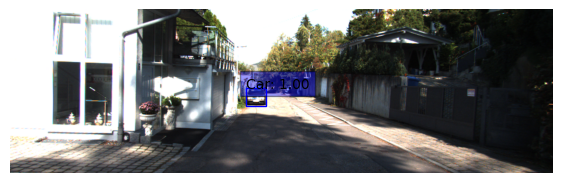

1/1 [==============================] - 0s 53ms/step


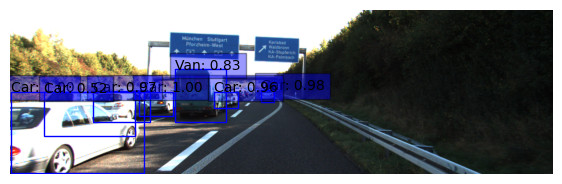

1/1 [==============================] - 0s 48ms/step


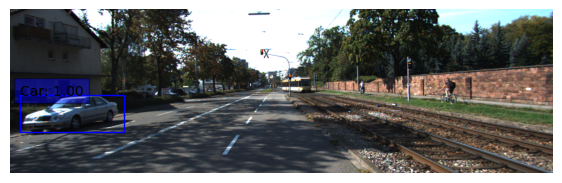

1/1 [==============================] - 0s 49ms/step


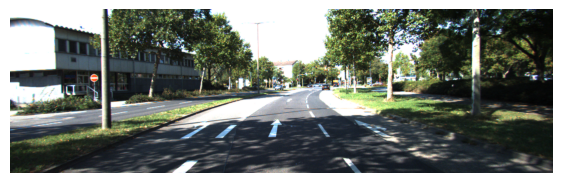

1/1 [==============================] - 0s 47ms/step


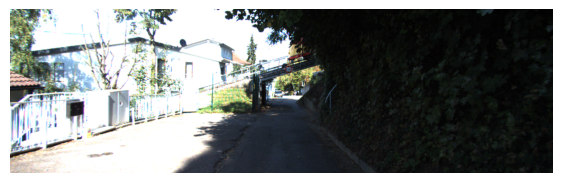

In [17]:
test_dataset = tfds.load("kitti", split="test", data_dir='D:/DATA/tdfs/')
int2str = dataset_info.features["objects"]["type"].int2str

for sample in test_dataset.take(5):
    image = tf.cast(sample["image"], dtype=tf.float32)
    input_image, ratio = prepare_image(image)
    detections = inference_model.predict(input_image)
    num_detections = detections.valid_detections[0]
    class_names = [
        int2str(int(x)) for x in detections.nmsed_classes[0][:num_detections]
    ]
    visualize_detections(
        image,
        detections.nmsed_boxes[0][:num_detections] / ratio,
        class_names,
        detections.nmsed_scores[0][:num_detections],
    )

- 세 번째 사진에 작게 트램과 자전거 탄 사람 2명이 있으나 인식하지 못함.
- 네 번째 사진에 멀리 차가 보이지만 인식하지 못함.
- 해당 사진에서만 인식에 실패한 것인지, 혹은 얼마나 작으면 인식을 못하는 것인지 확인해 볼 필요가 있음.

# 1. 자율주행 시스템 만들기

위에서 만든 모델을 통해 아래의 조건을 만족하는 함수를 만들어 주세요.

- 입력으로 이미지 경로를 받습니다.
- 정지조건에 맞는 경우 "Stop" 아닌 경우 "Go"를 반환합니다.
- 조건은 다음과 같습니다.
    - 사람이 한 명 이상 있는 경우
    - 차량의 크기(width or height)가 300px이상인 경우

In [119]:
def show_reason(img, boxes, idx, name, h=None, w=None):
    print(f"Found {name}!")
    if h and w:
        print(f"높이 {int(h)}px, 너비 {int(w)}px")

    plt.figure(figsize=(15, 15))
    reason = cv2.rectangle(img, (int(boxes[idx, 0]), int(img.shape[0]-boxes[idx, 3])),
                        (int(boxes[idx, 2]), int(img.shape[0]-boxes[idx, 1])),
                        (255, 0, 0), 3)
    plt.imshow(reason)

def self_drive_assist(img_path, size_limit=300, visualize=False, detection_only=False):
    # 원본 이미지를 로드하여 NumPy 배열로 변환
    img = np.array(Image.open(img_path))

    # 모델 입력에 맞게 이미지 전처리
    input_image, ratio = prepare_image(img)

    # Detection 실행
    detections = inference_model.predict(input_image)
    
    # 유효한 Detection 개수 가져오기
    num_detections = detections.valid_detections[0]    

    # 예측된 클래스 ID를 이름으로 변환
    class_names = [int2str(int(x)) for x in detections.nmsed_classes[0][:num_detections]]

    # 예측된 바운딩 박스 좌표 가져오기 및 원본 이미지 스케일로 조정
    # detections.nmsed_boxes는 (batch, num_boxes, 4) 형태로 (y_min, x_min, y_max, x_max)
    boxes = detections.nmsed_boxes[0][:num_detections] / ratio
    scores = detections.nmsed_scores[0][:num_detections]

    if detection_only: 
        visualize_detections(img, boxes, class_names, scores)
        return

    # 조건 확인
    human = ['Pedestrian', 'Person_sitting', 'Cyclist']
    vehicle = ['Car', 'Van', 'Truck', 'Tram', 'Misc']

    for i, name in enumerate(class_names):
        # 사람이 있는가?
        if name in human:
            if visualize: show_reason(img, boxes, i, name)
            return "Stop"
    
        # 차량이 있다면 높이 혹은 너비가 300px 이상인가?
        elif name in vehicle:
            h_px = boxes[i, 3] - boxes[i, 1]
            w_px = boxes[i, 2] - boxes[i, 0]
            if visualize: print(f"size of {name}: {int(h_px)}*{int(w_px)}")
            if h_px > size_limit or w_px > size_limit:
                if visualize: 
                    show_reason(img, boxes, i, name, h_px, w_px)
                return "Stop"
    # Detection 결과 시각화
    if visualize: visualize_detections(img, boxes, class_names, scores)
    return "Go"

In [ ]:
img_path = os.getenv('HOME')+'/aiffel/object_detection/data/stop_1.png'

print(self_drive_assist(img_path))

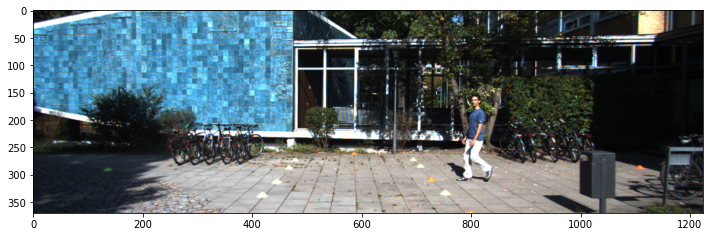

In [16]:
img_path = os.getenv('HOME')+'/aiffel/object_detection/data/stop_1.png'

plt.figure(figsize=(12, 8))
plt.imshow(Image.open(img_path))

# 2. 자율주행 시스템 평가하기

아래 `test_system()` 를 통해서 위에서 만든 함수를 평가해봅시다. 10장에 대해 Go와 Stop을 맞게 반환하는지 확인하고 100점 만점으로 평가해줍니다.

In [ ]:
def test_system(func):
    # work_dir = os.getenv('HOME')+'/aiffel/object_detection/data'
    work_dir = './data'
    score = 0
    test_set=[
        ("stop_1.png", "Stop"),
        ("stop_2.png", "Stop"),
        ("stop_3.png", "Stop"),
        ("stop_4.png", "Stop"),
        ("stop_5.png", "Stop"),
        ("go_1.png", "Go"),
        ("go_2.png", "Go"),
        ("go_3.png", "Go"),
        ("go_4.png", "Go"),
        ("go_5.png", "Go"),
    ]
    
    for image_file, answer in test_set:
        image_path = work_dir + '/' + image_file
        pred = func(image_path)
        if pred == answer:
            score += 10
        else: print(image_file) # 틀린 문제 출력
    print(f"{score}점입니다.")

test_system(self_drive_assist)

1/1 [==============================] - 0s 48ms/step
go_3.png
1/1 [==============================] - 0s 48ms/step
90점입니다.


- 총 10 문제 중 9 문제 정답으로 90점 달성.
- 그렇다면 틀린 문제는 왜 틀린 것인지 확인
    - "go_3.png"에서 정답은 "Go"이지만 "Stop"을 출력한 원인 시각화

1/1 [==============================] - 0s 233ms/step
size of Car: 29*89
size of Car: 22*27
Found Cyclist!
Stop


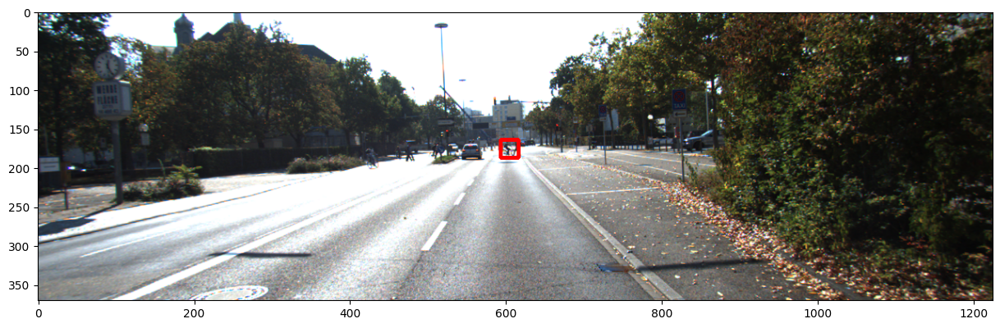

In [89]:
img_path = './data/go_3.png'

print(self_drive_assist(img_path, visualize=True))

- 모델은 화면 중앙에 아주 작게 자전거를 탄 사람이 있다고 판단하여 "Stop"을 리턴함.
- 좀 더 명확한 확인을 위해 바운딩 박스 없이 확대해서 확인.

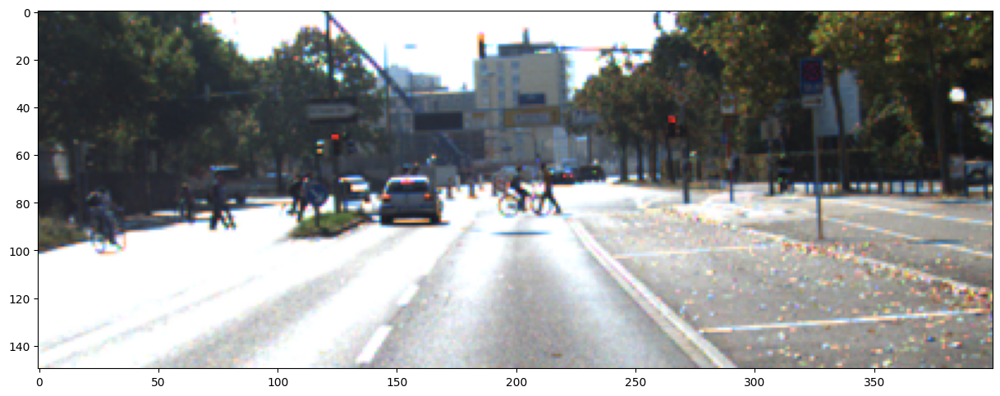

In [79]:
plt.figure(figsize=(15, 15))
check_img = np.array(Image.open(img_path))
check_img[100:200]
plt.imshow(check_img[100:250, 400:800])

- 자전거 탄 사람들과 보행자가 있는 것으로 확인. 이것은 문제 오류.
    - 해당 문제에서 제시한 조건은 이미지 내에 사람이 한 명 이상 있다면 "Stop"을 출력하는 것이므로 문제 오류이다.

- 그렇다면 나머지 "Go" 이미지는 오류가 없는지, "Stop"이미지에서는 오류가 없는지 확인해볼 필요가 있다.

1/1 [==============================] - 0s 338ms/step
size of Car: 30*32
size of Truck: 31*62
size of Car: 25*42
size of Truck: 105*163


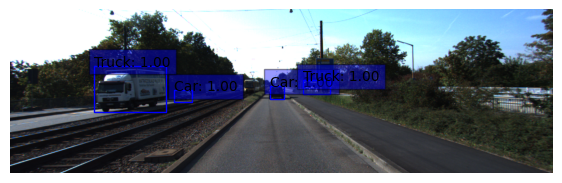

Go


In [90]:
img_path = './data/go_1.png'

print(self_drive_assist(img_path, visualize=True))

- 차량을 인식했으나 제한 크기 미만. 문제없음.

1/1 [==============================] - 0s 284ms/step
size of Car: 40*39
size of Car: 35*57
size of Car: 28*40


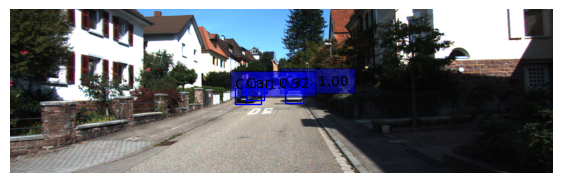

Go


In [91]:
img_path = './data/go_2.png'

print(self_drive_assist(img_path, visualize=True))

- 차량을 인식했으나 제한 크기 미만. 문제없음.

1/1 [==============================] - 0s 216ms/step
size of Car: 81*102


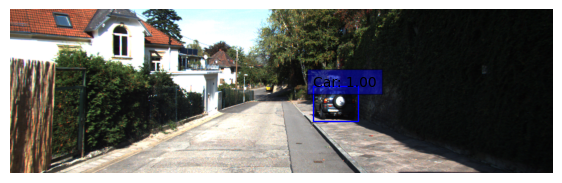

Go


In [92]:
img_path = './data/go_4.png'

print(self_drive_assist(img_path, visualize=True))

- 차량을 인식했으나 제한 크기 미만. 문제없음.

1/1 [==============================] - 0s 248ms/step
size of Car: 72*186
size of Car: 118*220
size of Car: 43*104
size of Car: 44*85
size of Car: 31*41
size of Car: 153*67


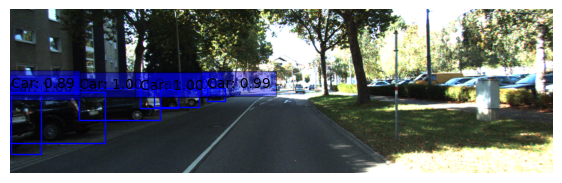

Go


In [ ]:
img_path = './data/go_5.png'
print(self_drive_assist(img_path, visualize=True))

1/1 [==============================] - 0s 301ms/step
Found Pedestrian!
Stop


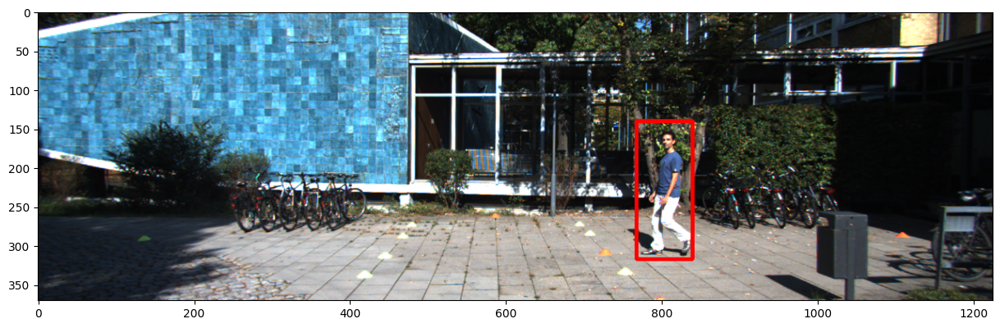

In [95]:
img_path = './data/stop_1.png'
print(self_drive_assist(img_path, visualize=True))

1/1 [==============================] - 0s 250ms/step
Found Pedestrian!
Stop


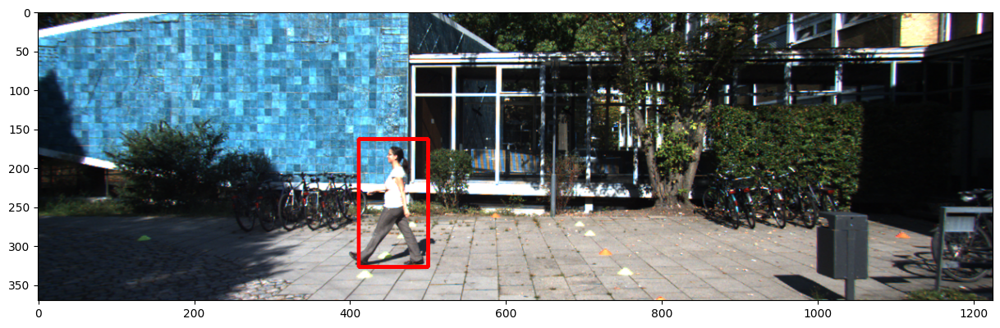

In [97]:
img_path = './data/stop_2.png'
print(self_drive_assist(img_path, visualize=True))

1/1 [==============================] - 0s 332ms/step
size of Car: 167*305
Found Car!
높이 167px, 너비 305px
Stop


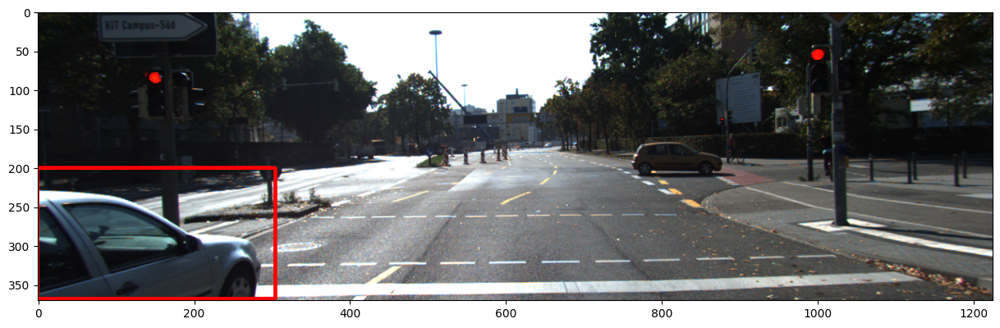

In [98]:
img_path = './data/stop_3.png'
print(self_drive_assist(img_path, visualize=True))

- 차량의 너비가 제한 크기 초과. 문제없음.

1/1 [==============================] - 0s 302ms/step
size of Car: 49*109
size of Car: 77*105
size of Van: 82*76
size of Car: 42*114
size of Car: 157*367
Found Car!
높이 157px, 너비 367px
Stop


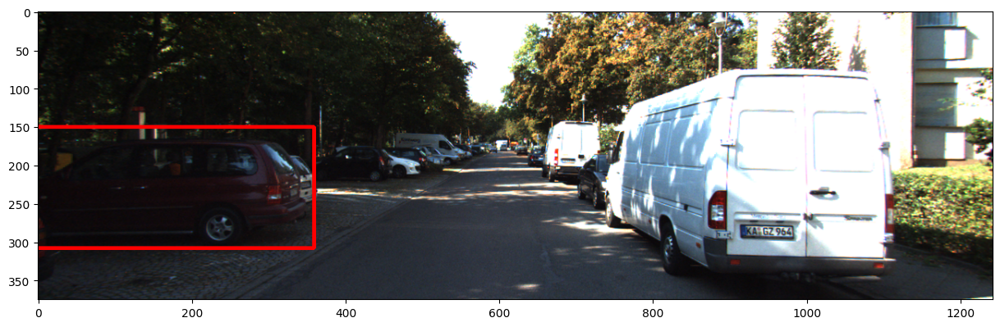

In [99]:
img_path = './data/stop_4.png'
print(self_drive_assist(img_path, visualize=True))

- 차량의 너비가 제한 크기 초과. 문제없음.

1/1 [==============================] - 0s 323ms/step
size of Car: 77*123
size of Car: 35*50
size of Car: 197*349
Found Car!
높이 197px, 너비 349px
Stop


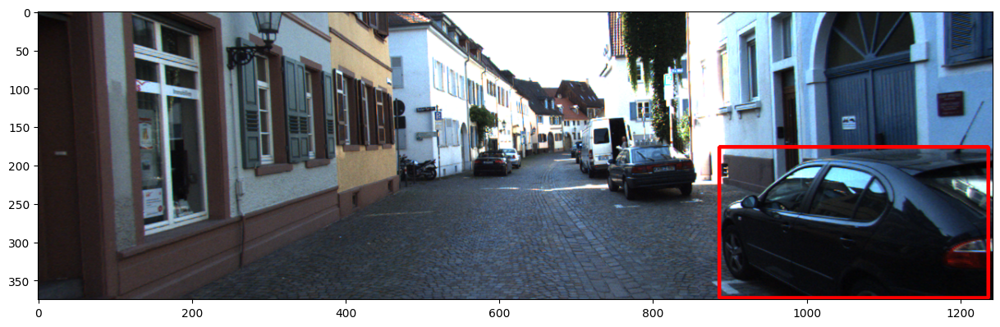

In [100]:
img_path = './data/stop_5.png'
print(self_drive_assist(img_path, visualize=True))

- 차량의 크기가 제한 크기 초과. 문제없음.

# 결론

- 테스트 결과는 90%의 정답률을 보였으나, 오답인 경우는 문제의 오류였으므로 이를 정답 처리한다면 정답률 100% 달성했다고 할 수 있다.

- 다만, 문제에서 제시한 조건은 실제 주행 상황과 맞지 않는 부분이 많다.
    1. 인식한 차량의 너비가 제한 크기를 초과하더라고 본 차량의 주행 진로를 방해하지 않는다면 멈출 필요가 없음.
    2. 사람이 한 명 이상 있더라도 주행 진로와 무관하다면 멈출 필요가 없음.
    3. 차량이나 사람이 없더라고 도로 상황에 따라 멈출 필요가 있음.
        - 예) 신호등, 일시정지 표시판, 기타 장애물 등
    4. 주행 진로에 장애물이나 적색 신호, 일시정지 표시 등이 있더라도 남은 거리에 따라 당장 멈출 필요가 없기도 하다.

    - 그러므로 신호등이나 표시판, 기타 장애물 등을 인식할 수 있도록 추가하여 추가 조건을 부여해 일부 개선이 가능하다.
    - 또한, 주행 진로 범위를 대략적으로 설정하여 해당 범위 내에 장애물이 있다면 멈추지 않도록 하여 일부 개선이 가능하다.
    - RGB 카메라로 수집하는 단일 이미지로는 거리를 예측하기 어려우니 진로 범위 내 객체의 일정 픽셀 크기로 대략적인 거리를 판단하여 Go, Stop 여부를 판단한다면 일부 개선 가능성이 있어 보인다.

# 추가 실험

1/1 [==============================] - 0s 298ms/step


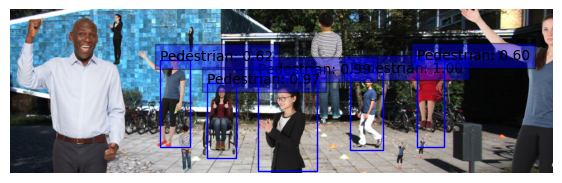

In [127]:
img_path = './data/stop_6.jpg'
self_drive_assist(img_path, detection_only=True)

- 이미지의 혼잡도에 따라 성능 저하 현상이 발생하는 것 같다.

1/1 [==============================] - 0s 213ms/step


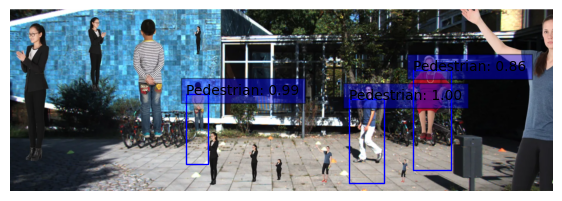

In [125]:
img_path = './data/stop_8.jpg'
self_drive_assist(img_path, detection_only=True)

1/1 [==============================] - 0s 332ms/step


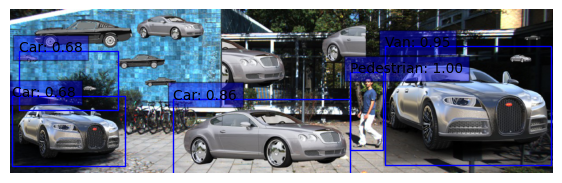

In [126]:
img_path = './data/stop_7.jpg'
self_drive_assist(img_path, detection_only=True)

- 두 대의 차를 하나의 바운딩 박스에 묶어서 표기한 것처럼 보이는 것도 있다.
    - 하나의 앵커 박스에서 두 대가 발견된 경우일 가능성이 있어 보인다.

1/1 [==============================] - 0s 235ms/step


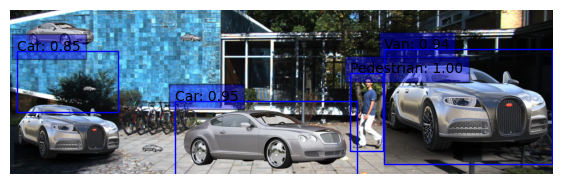

In [124]:
img_path = './data/stop_9.jpg'
self_drive_assist(img_path, detection_only=True)

1/1 [==============================] - 0s 283ms/step


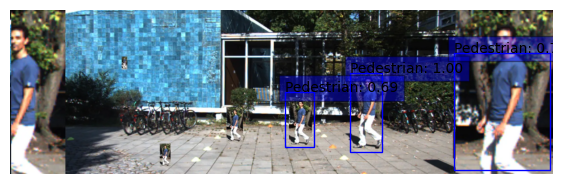

In [128]:
img_path = './data/stop_10.jpg'
self_drive_assist(img_path, detection_only=True)

- 훨씬 더 작은 객체도 인식했던 것과는 달리 잘 인식하던 객체가 작아진 것을 인식하지 못했다.

# 회고

- 데이터셋 확보 과정에서 예상보다 많은 시간이 소비되어 프로젝트 진행에 더 시간을 쓰지 못한 부분이 다소 아쉽다.

- RetinaNet이 꽤나 작은 객체까지 인지할 수 있는 능력을 확인한 점에서 FPN의 위력을 체감 할 수 있어서 좋았다.

- 본격적으로 Object Detection 모델을 학습 시키는 과정에서 mAP와 같은 평가 지표를 사용하지 못한 부분이 아쉬웠다. mAP에 대해 빨리 익히고 이후 과정에서는 적용해 볼 수 있도록 해야겠다.

---